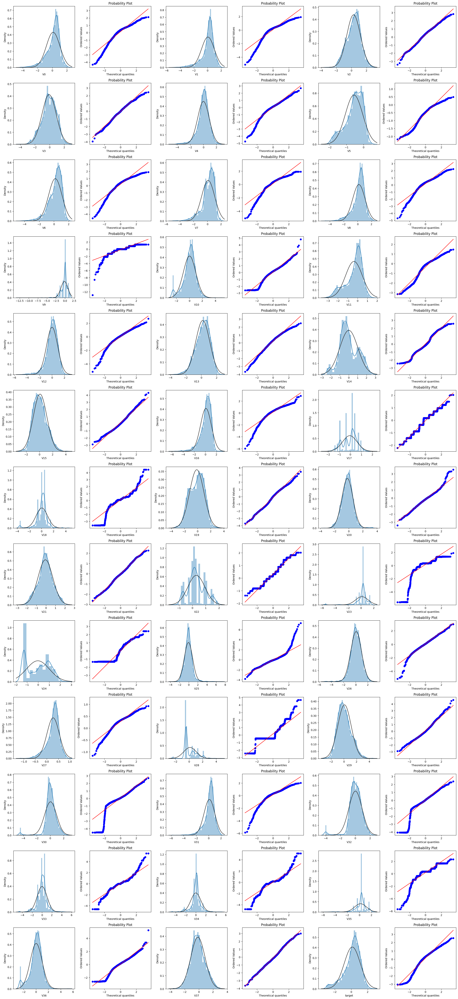

Linear Regression with cleaned data:  0.0988973515488954
Linear Regression with PCA-transformed data:  0.14180092983448964


In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.decomposition import PCA
import warnings

warnings.filterwarnings("ignore")

# Load the data
data_file = "Industrial_data_for regression_analysis.txt"
data = pd.read_csv(data_file, sep='\t', encoding='utf-8')

# Function to remove outliers
def remove_outliers(df):
    Q1 = df.quantile(0.25)
    Q3 = df.quantile(0.75)
    IQR = Q3 - Q1
    return df[~((df < (Q1 - 1.5 * IQR)) | (df > (Q3 + 1.5 * IQR))).any(axis=1)]

# Remove outliers
data_clean = remove_outliers(data.iloc[:, :-1])

# Splitting data into features and target
X_clean = data_clean.iloc[:, :-1]
y_clean = data_clean.iloc[:, -1]

# Visualizing data distribution
fig_cols = 6
fig_rows = len(data.columns)
plt.figure(figsize=(4*fig_cols, 4*fig_rows))

i = 0
for col in data.columns:
    i += 1
    ax = plt.subplot(fig_rows, fig_cols, i)
    sns.distplot(data[col], fit=stats.norm)
    
    i += 1
    ax = plt.subplot(fig_rows, fig_cols, i)
    res = stats.probplot(data[col], plot=plt)

plt.tight_layout()
plt.show()

# Train-test split with cleaned data
X_train_clean, X_test_clean, y_train_clean, y_test_clean = train_test_split(X_clean, y_clean, test_size=0.3)

# Train-test split with original data
X_train, X_test, y_train, y_test = train_test_split(data.iloc[:, :-1], data.iloc[:, -1], test_size=0.3)

# Instantiate PCA with desired number of components
pca = PCA(n_components=0.95)  # Retain 95% of variance

# Fit PCA on the training data
pca.fit(X_train)

# Transform both training and test data with PCA
X_train_pca = pca.transform(X_train)
X_test_pca = pca.transform(X_test)

# Linear Regression with cleaned data
clf_clean = LinearRegression()
clf_clean.fit(X_train_clean, y_train_clean)
score_clean = mean_squared_error(y_test_clean, clf_clean.predict(X_test_clean))
print("Linear Regression with cleaned data: ", score_clean)

# Linear Regression with PCA-transformed data
clf_pca = LinearRegression()
clf_pca.fit(X_train_pca, y_train)
score_pca = mean_squared_error(y_test, clf_pca.predict(X_test_pca))
print("Linear Regression with PCA-transformed data: ", score_pca)


In [2]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

# Original code
def original_code(data):
    X = data.iloc[:, :-1]
    y = data.iloc[:, -1]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)
    clf = LinearRegression()
    clf.fit(X_train, y_train)
    score = mean_squared_error(y_test, clf.predict(X_test))
    return score

# Modified code
def modified_code(data):
    from scipy import stats
    from sklearn.decomposition import PCA
    import seaborn as sns
    import matplotlib.pyplot as plt
    import warnings

    warnings.filterwarnings("ignore")

    # Function to remove outliers
    def remove_outliers(df):
        Q1 = df.quantile(0.25)
        Q3 = df.quantile(0.75)
        IQR = Q3 - Q1
        return df[~((df < (Q1 - 1.5 * IQR)) | (df > (Q3 + 1.5 * IQR))).any(axis=1)]

    # Remove outliers
    data_clean = remove_outliers(data.iloc[:, :-1])

    # Splitting data into features and target
    X_clean = data_clean.iloc[:, :-1]
    y_clean = data_clean.iloc[:, -1]

    # Train-test split with cleaned data
    X_train_clean, X_test_clean, y_train_clean, y_test_clean = train_test_split(X_clean, y_clean, test_size=0.3)

    # Train-test split with original data
    X_train, X_test, y_train, y_test = train_test_split(data.iloc[:, :-1], data.iloc[:, -1], test_size=0.3)

    # Linear Regression with original data
    clf_original = LinearRegression()
    clf_original.fit(X_train, y_train)
    score_original = mean_squared_error(y_test, clf_original.predict(X_test))

    # Linear Regression with cleaned data
    clf_clean = LinearRegression()
    clf_clean.fit(X_train_clean, y_train_clean)
    score_clean = mean_squared_error(y_test_clean, clf_clean.predict(X_test_clean))

    return score_original, score_clean

# Load the data
data_file = "Industrial_data_for regression_analysis.txt"
data = pd.read_csv(data_file, sep='\t', encoding='utf-8')

# Original code result
original_result = original_code(data)

# Modified code result
modified_result_original, modified_result_cleaned = modified_code(data)

# Comparison
print("Original Code Result (MSE):", original_result)
print("Modified Code Result - Original Data (MSE):", modified_result_original)
print("Modified Code Result - Cleaned Data (MSE):", modified_result_cleaned)


Original Code Result (MSE): 0.10356322899089004
Modified Code Result - Original Data (MSE): 0.11794284447721375
Modified Code Result - Cleaned Data (MSE): 0.10841329840002437


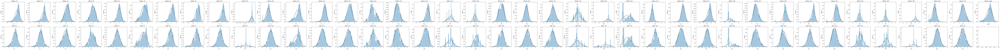

Original Code Result (MSE): 0.12200888880322308
Modified Code Result - Original Data (MSE): 0.11635189219139853
Modified Code Result - Cleaned Data (MSE): 0.1280445604948819


In [3]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from scipy import stats
from sklearn.decomposition import PCA
import seaborn as sns
import matplotlib.pyplot as plt
import warnings

warnings.filterwarnings("ignore")

# Original code
def original_code(data):
    X = data.iloc[:, :-1]
    y = data.iloc[:, -1]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)
    clf = LinearRegression()
    clf.fit(X_train, y_train)
    score = mean_squared_error(y_test, clf.predict(X_test))
    return score

# Modified code
def modified_code(data):
    # Function to remove outliers
    def remove_outliers(df):
        Q1 = df.quantile(0.25)
        Q3 = df.quantile(0.75)
        IQR = Q3 - Q1
        return df[~((df < (Q1 - 1.5 * IQR)) | (df > (Q3 + 1.5 * IQR))).any(axis=1)]

    # Remove outliers
    data_clean = remove_outliers(data.iloc[:, :-1])

    # Visualizing data distribution before and after modification
    fig, axes = plt.subplots(2, len(data.columns), figsize=(4*len(data.columns), 8))
    for i, col in enumerate(data.columns):
        sns.distplot(data[col], fit=stats.norm, ax=axes[0, i])
        axes[0, i].set_title(f"Before: {col}")

    for i, col in enumerate(data_clean.columns):
        sns.distplot(data_clean[col], fit=stats.norm, ax=axes[1, i])
        axes[1, i].set_title(f"After: {col}")

    plt.tight_layout()
    plt.show()

    # Splitting data into features and target
    X_clean = data_clean.iloc[:, :-1]
    y_clean = data_clean.iloc[:, -1]

    # Train-test split with cleaned data
    X_train_clean, X_test_clean, y_train_clean, y_test_clean = train_test_split(X_clean, y_clean, test_size=0.3)

    # Train-test split with original data
    X_train, X_test, y_train, y_test = train_test_split(data.iloc[:, :-1], data.iloc[:, -1], test_size=0.3)

    # Linear Regression with original data
    clf_original = LinearRegression()
    clf_original.fit(X_train, y_train)
    score_original = mean_squared_error(y_test, clf_original.predict(X_test))

    # Linear Regression with cleaned data
    clf_clean = LinearRegression()
    clf_clean.fit(X_train_clean, y_train_clean)
    score_clean = mean_squared_error(y_test_clean, clf_clean.predict(X_test_clean))

    return score_original, score_clean

# Load the data
data_file = "Industrial_data_for regression_analysis.txt"
data = pd.read_csv(data_file, sep='\t', encoding='utf-8')

# Original code result
original_result = original_code(data)

# Modified code result
modified_result_original, modified_result_cleaned = modified_code(data)

# Comparison
print("Original Code Result (MSE):", original_result)
print("Modified Code Result - Original Data (MSE):", modified_result_original)
print("Modified Code Result - Cleaned Data (MSE):", modified_result_cleaned)


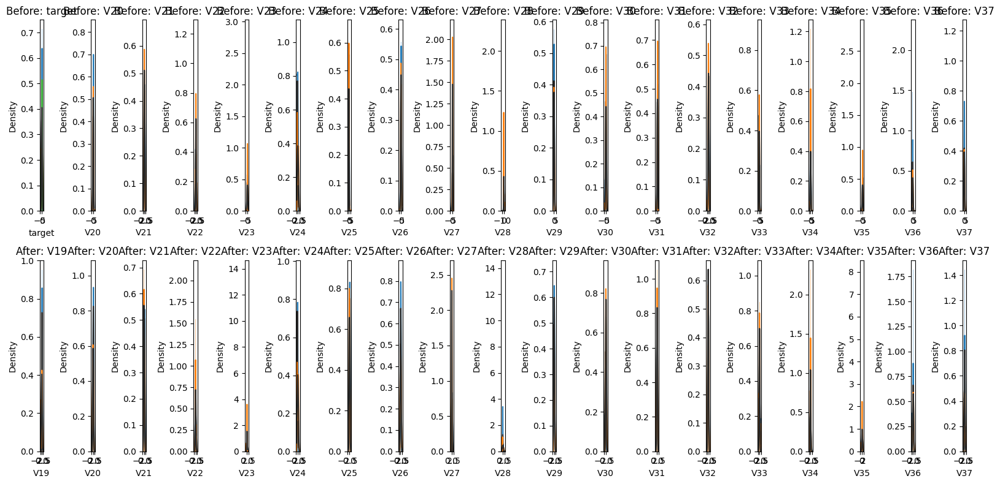

Original Code Result (MSE): 0.10183395836451938
Modified Code Result - Original Data (MSE): 0.10591050664862232
Modified Code Result - Cleaned Data (MSE): 0.10366257263588007


In [4]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from scipy import stats
from sklearn.decomposition import PCA
import seaborn as sns
import matplotlib.pyplot as plt
import warnings

warnings.filterwarnings("ignore")

# Original code
def original_code(data):
    X = data.iloc[:, :-1]
    y = data.iloc[:, -1]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)
    clf = LinearRegression()
    clf.fit(X_train, y_train)
    score = mean_squared_error(y_test, clf.predict(X_test))
    return score

# Modified code
def modified_code(data):
    # Function to remove outliers
    def remove_outliers(df):
        Q1 = df.quantile(0.25)
        Q3 = df.quantile(0.75)
        IQR = Q3 - Q1
        return df[~((df < (Q1 - 1.5 * IQR)) | (df > (Q3 + 1.5 * IQR))).any(axis=1)]

    # Remove outliers
    data_clean = remove_outliers(data.iloc[:, :-1])

    # Visualizing data distribution before and after modification
    fig, axes = plt.subplots(2, len(data.columns) // 2, figsize=(16, 8))
    for i, col in enumerate(data.columns):
        sns.distplot(data[col], fit=stats.norm, ax=axes[0, i % (len(data.columns) // 2)])
        axes[0, i % (len(data.columns) // 2)].set_title(f"Before: {col}")

    for i, col in enumerate(data_clean.columns):
        sns.distplot(data_clean[col], fit=stats.norm, ax=axes[1, i % (len(data.columns) // 2)])
        axes[1, i % (len(data.columns) // 2)].set_title(f"After: {col}")

    plt.tight_layout()
    plt.show()

    # Splitting data into features and target
    X_clean = data_clean.iloc[:, :-1]
    y_clean = data_clean.iloc[:, -1]

    # Train-test split with cleaned data
    X_train_clean, X_test_clean, y_train_clean, y_test_clean = train_test_split(X_clean, y_clean, test_size=0.3)

    # Train-test split with original data
    X_train, X_test, y_train, y_test = train_test_split(data.iloc[:, :-1], data.iloc[:, -1], test_size=0.3)

    # Linear Regression with original data
    clf_original = LinearRegression()
    clf_original.fit(X_train, y_train)
    score_original = mean_squared_error(y_test, clf_original.predict(X_test))

    # Linear Regression with cleaned data
    clf_clean = LinearRegression()
    clf_clean.fit(X_train_clean, y_train_clean)
    score_clean = mean_squared_error(y_test_clean, clf_clean.predict(X_test_clean))

    return score_original, score_clean

# Load the data
data_file = "Industrial_data_for regression_analysis.txt"
data = pd.read_csv(data_file, sep='\t', encoding='utf-8')

# Original code result
original_result = original_code(data)

# Modified code result
modified_result_original, modified_result_cleaned = modified_code(data)

# Comparison
print("Original Code Result (MSE):", original_result)
print("Modified Code Result - Original Data (MSE):", modified_result_original)
print("Modified Code Result - Cleaned Data (MSE):", modified_result_cleaned)


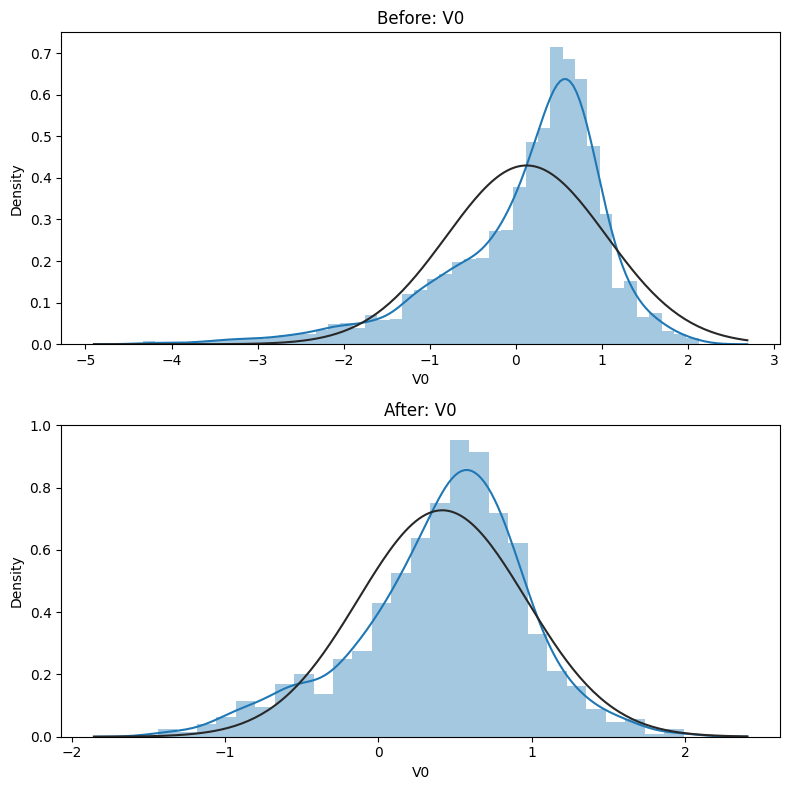

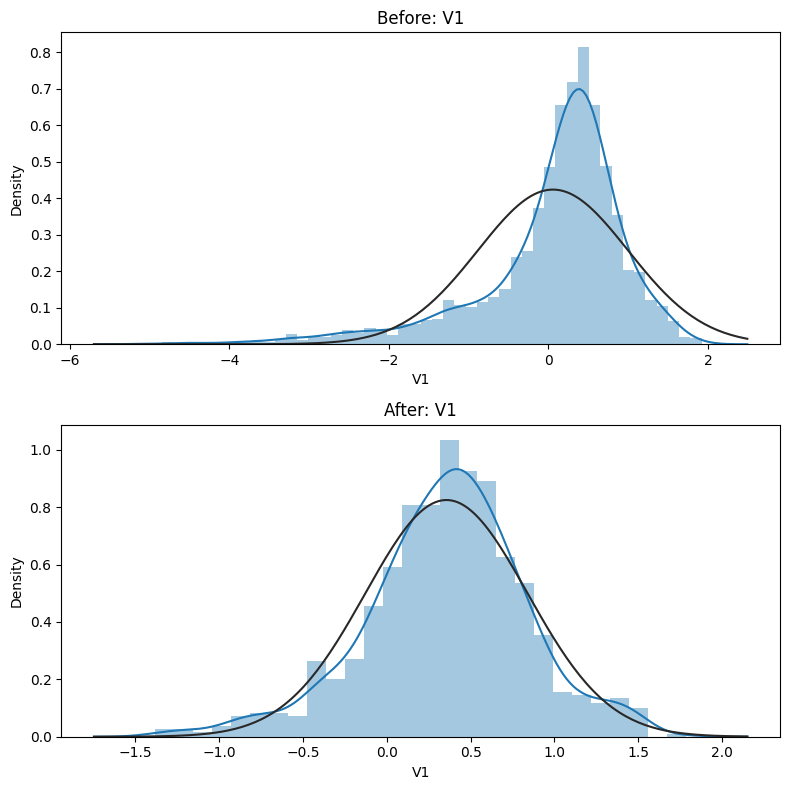

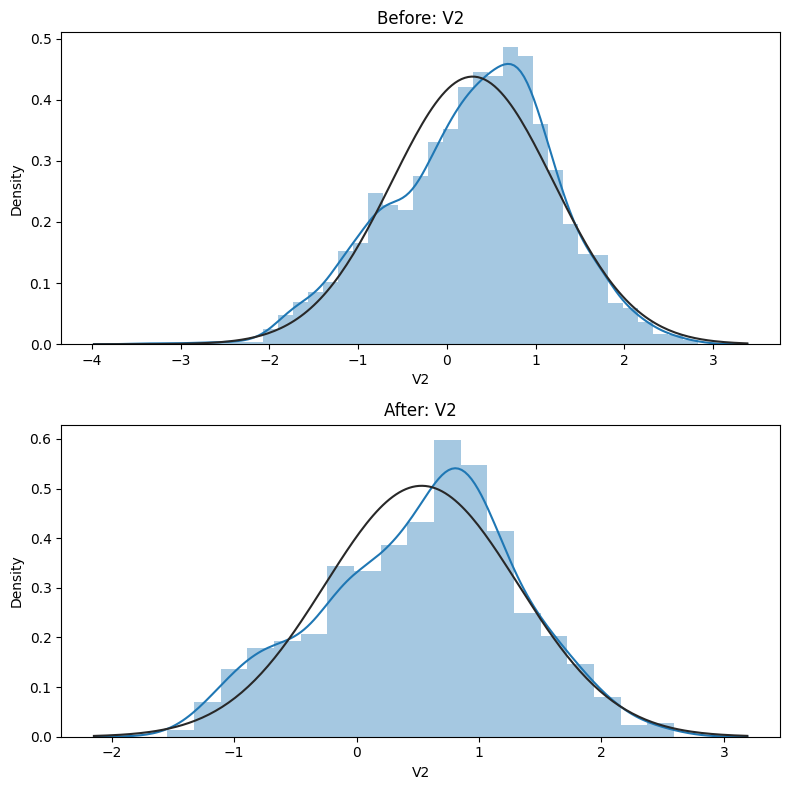

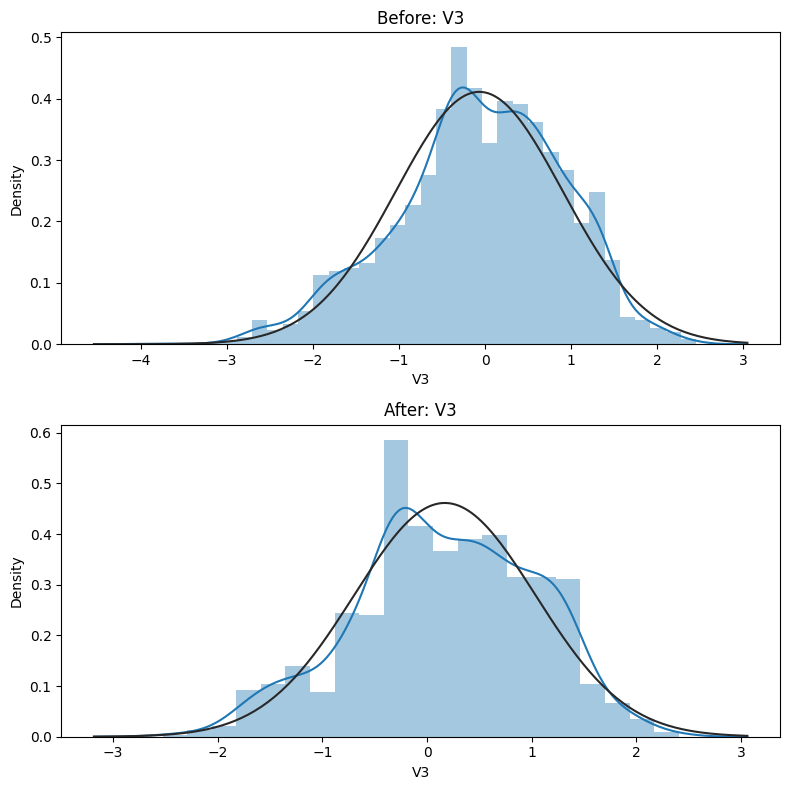

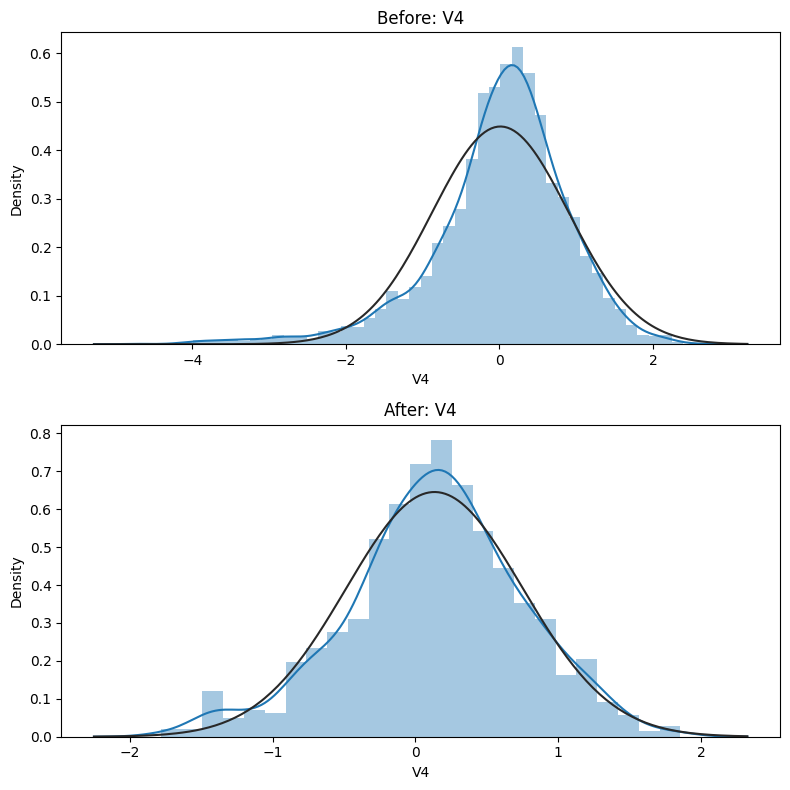

...

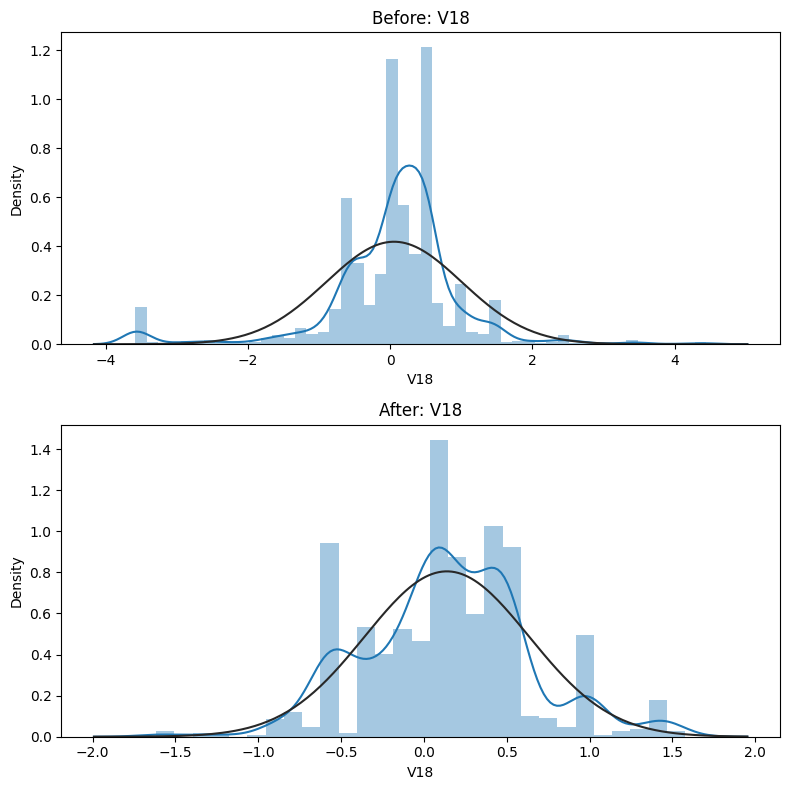

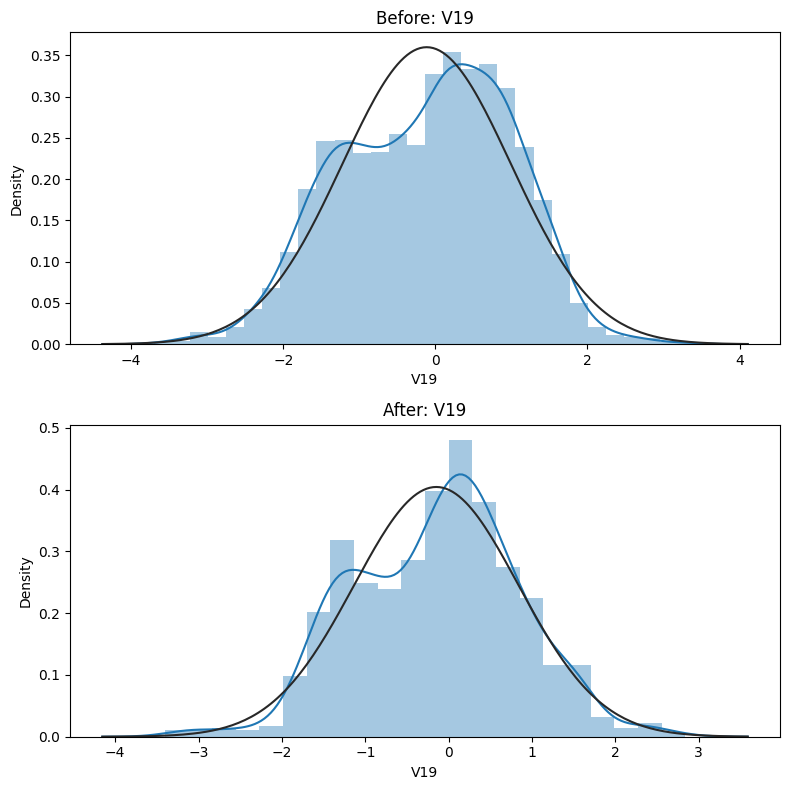

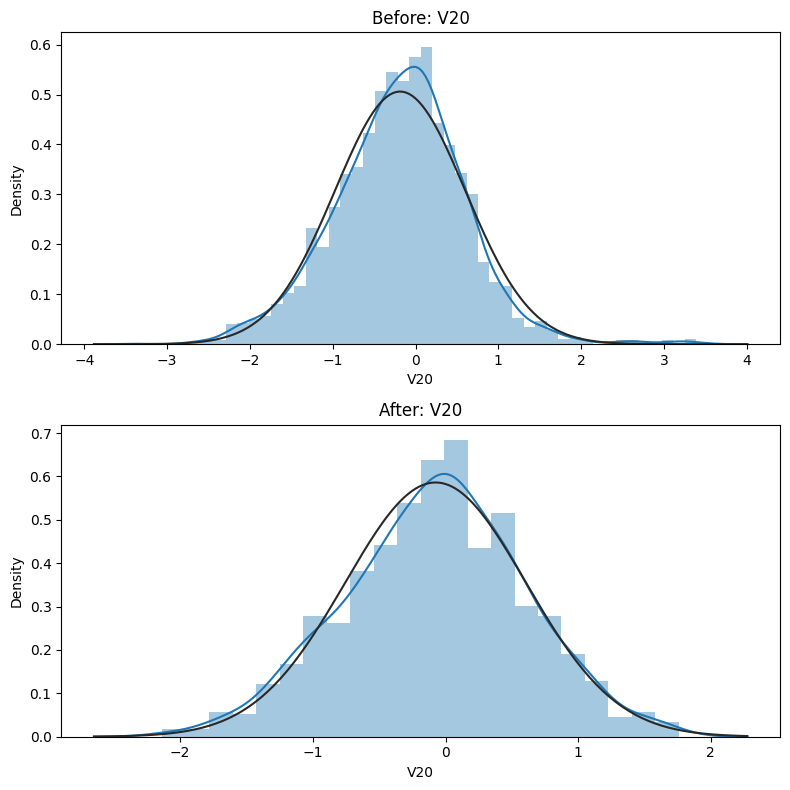

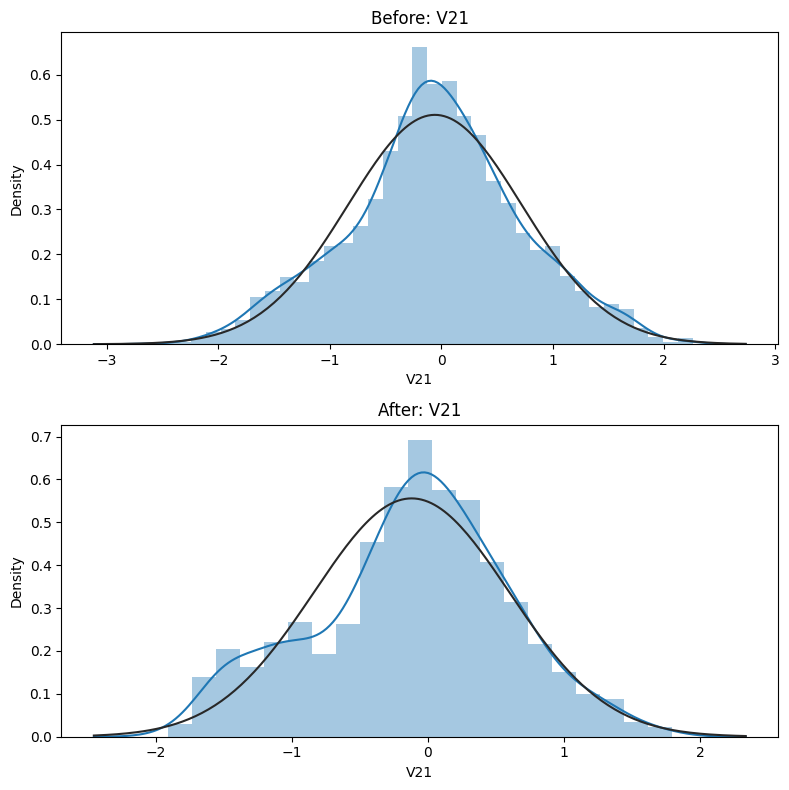

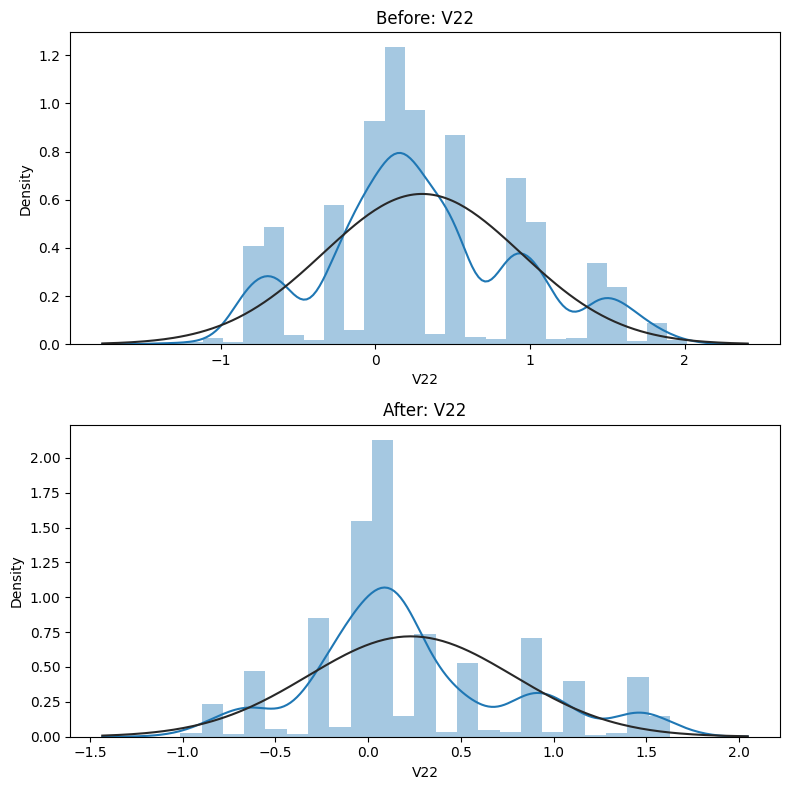

In [5]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from scipy import stats
from sklearn.decomposition import PCA
import seaborn as sns
import matplotlib.pyplot as plt
import warnings

warnings.filterwarnings("ignore")

# Original code
def original_code(data):
    X = data.iloc[:, :-1]
    y = data.iloc[:, -1]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)
    clf = LinearRegression()
    clf.fit(X_train, y_train)
    score = mean_squared_error(y_test, clf.predict(X_test))
    return score

# Modified code
def modified_code(data):
    # Function to remove outliers
    def remove_outliers(df):
        Q1 = df.quantile(0.25)
        Q3 = df.quantile(0.75)
        IQR = Q3 - Q1
        return df[~((df < (Q1 - 1.5 * IQR)) | (df > (Q3 + 1.5 * IQR))).any(axis=1)]

    # Remove outliers
    data_clean = remove_outliers(data.iloc[:, :-1])

    # Visualizing data distribution before and after modification
    for col in data.columns:
        fig, axes = plt.subplots(2, 1, figsize=(8, 8))
        sns.distplot(data[col], fit=stats.norm, ax=axes[0])
        axes[0].set_title(f"Before: {col}")
        
        sns.distplot(data_clean[col], fit=stats.norm, ax=axes[1])
        axes[1].set_title(f"After: {col}")

        plt.tight_layout()
        plt.show()

    # Splitting data into features and target
    X_clean = data_clean.iloc[:, :-1]
    y_clean = data_clean.iloc[:, -1]

    # Train-test split with cleaned data
    X_train_clean, X_test_clean, y_train_clean, y_test_clean = train_test_split(X_clean, y_clean, test_size=0.3)

    # Train-test split with original data
    X_train, X_test, y_train, y_test = train_test_split(data.iloc[:, :-1], data.iloc[:, -1], test_size=0.3)

    # Linear Regression with original data
    clf_original = LinearRegression()
    clf_original.fit(X_train, y_train)
    score_original = mean_squared_error(y_test, clf_original.predict(X_test))

    # Linear Regression with cleaned data
    clf_clean = LinearRegression()
    clf_clean.fit(X_train_clean, y_train_clean)
    score_clean = mean_squared_error(y_test_clean, clf_clean.predict(X_test_clean))

    return score_original, score_clean

# Load the data
data_file = "Industrial_data_for regression_analysis.txt"
data = pd.read_csv(data_file, sep='\t', encoding='utf-8')

# Original code result
original_result = original_code(data)

# Modified code result
modified_result_original, modified_result_cleaned = modified_code(data)

# Comparison
print("Original Code Result (MSE):", original_result)
print("Modified Code Result - Original Data (MSE):", modified_result_original)
print("Modified Code Result - Cleaned Data (MSE):", modified_result_cleaned)



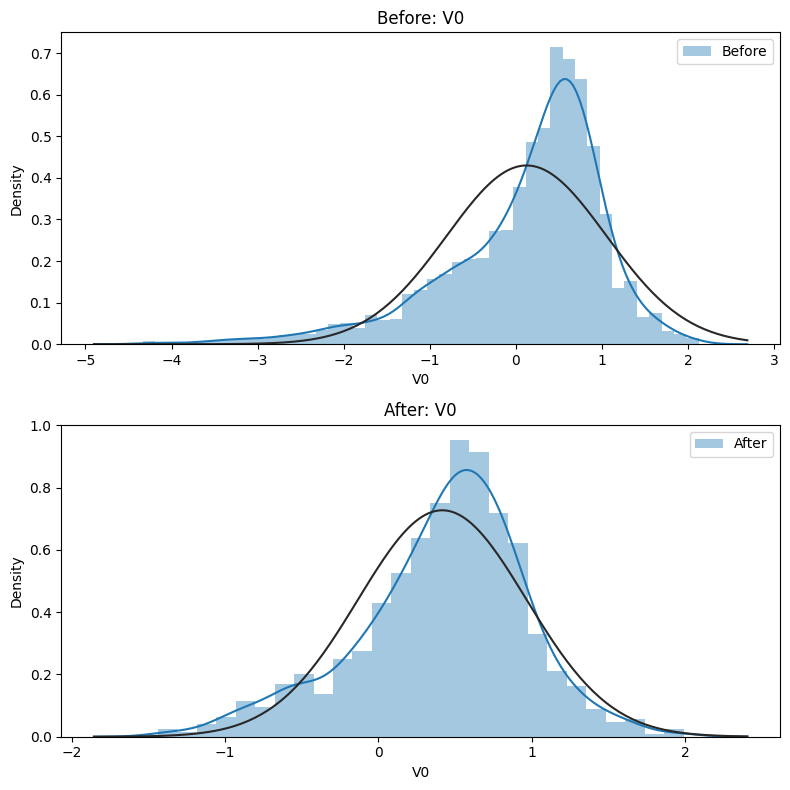

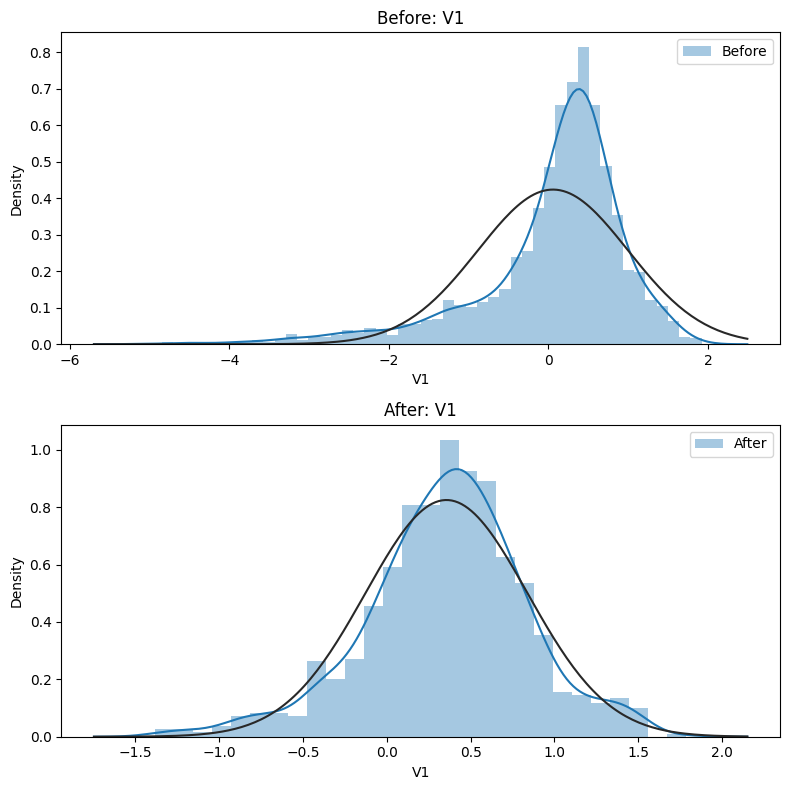

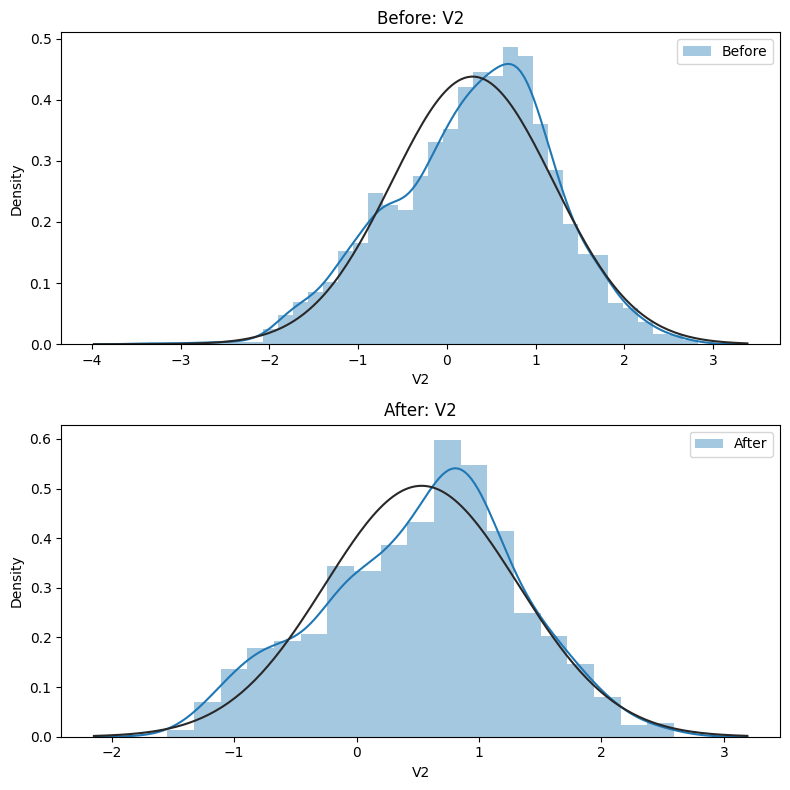

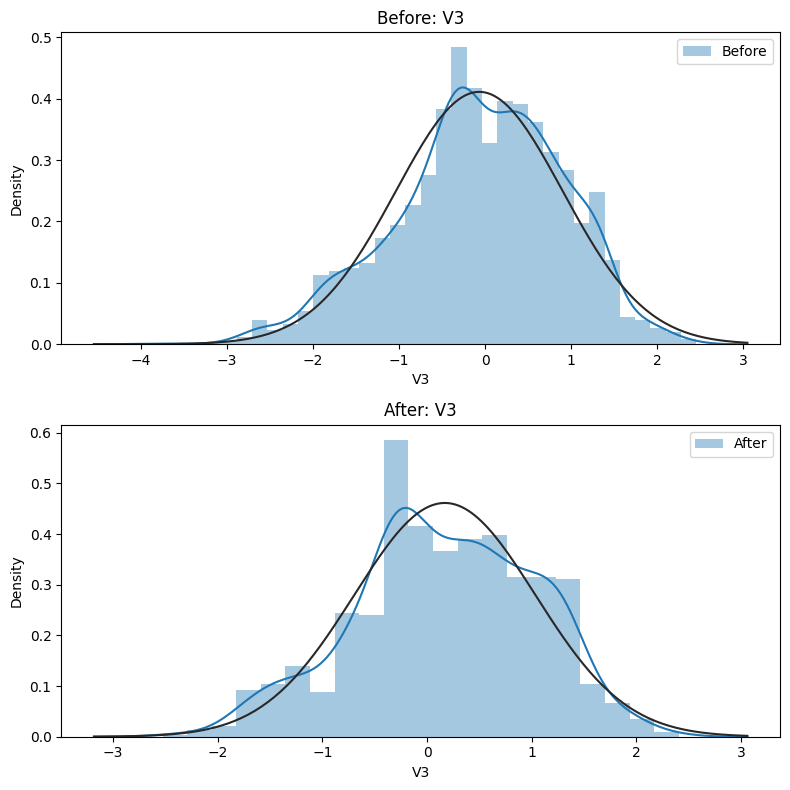

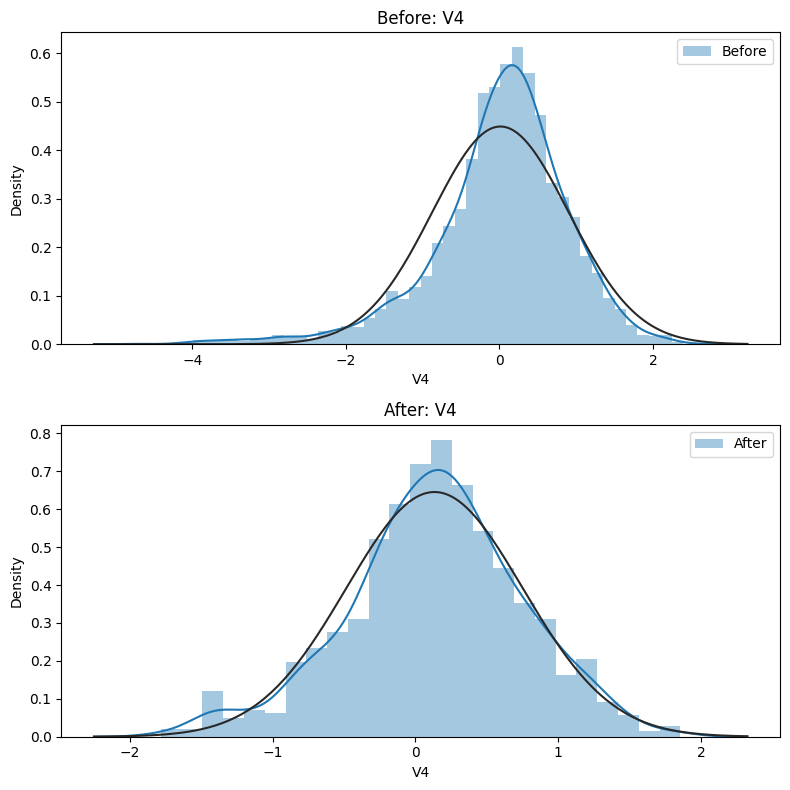

...

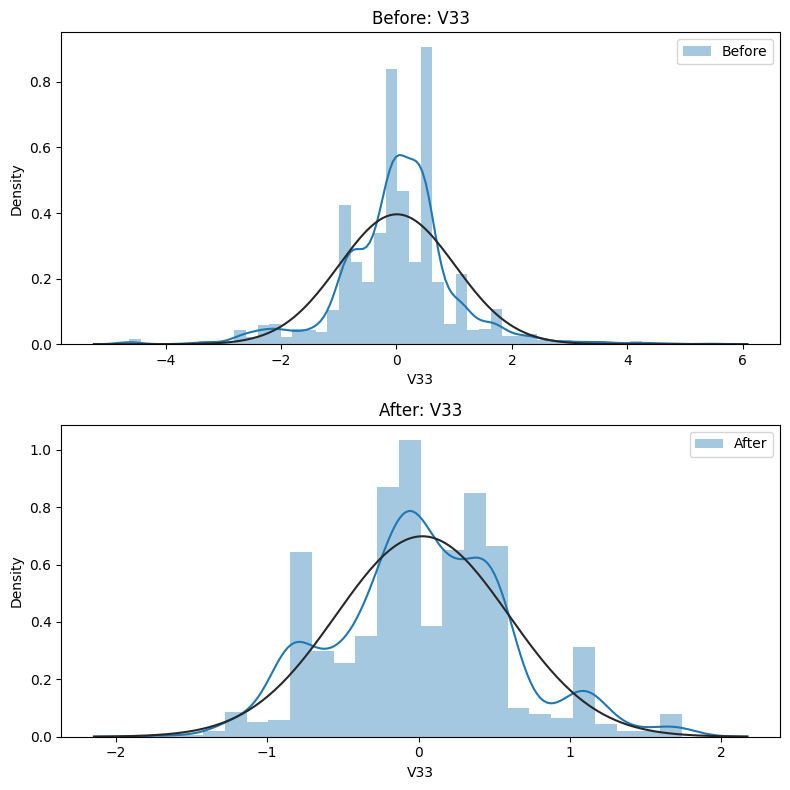

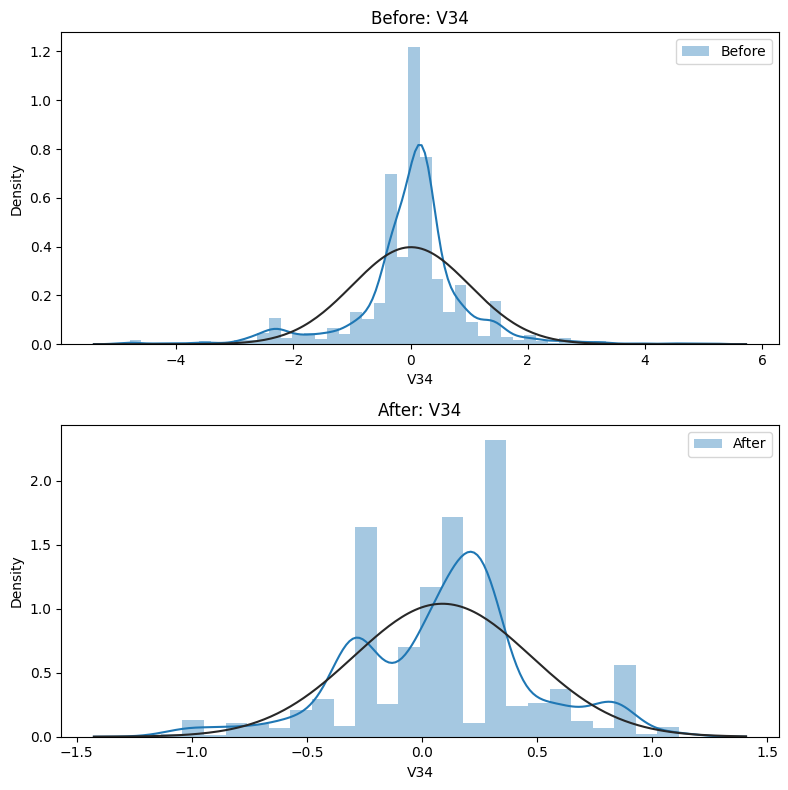

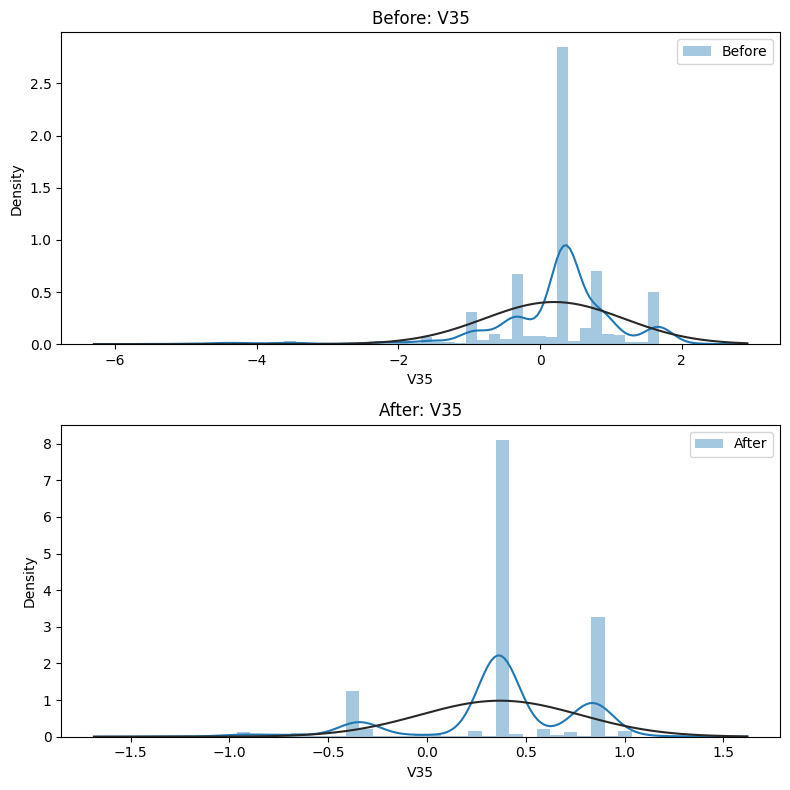

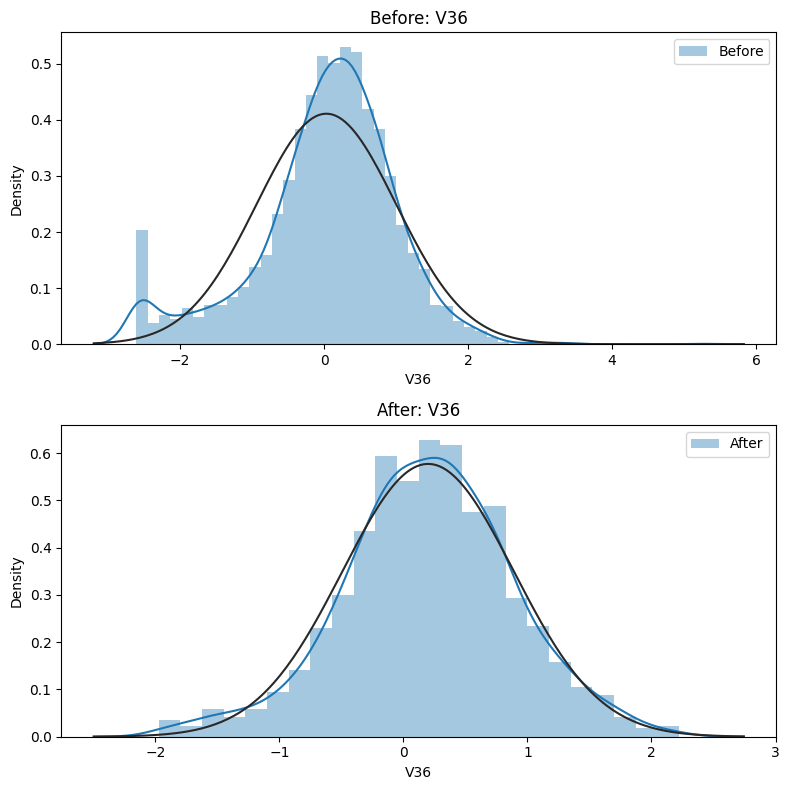

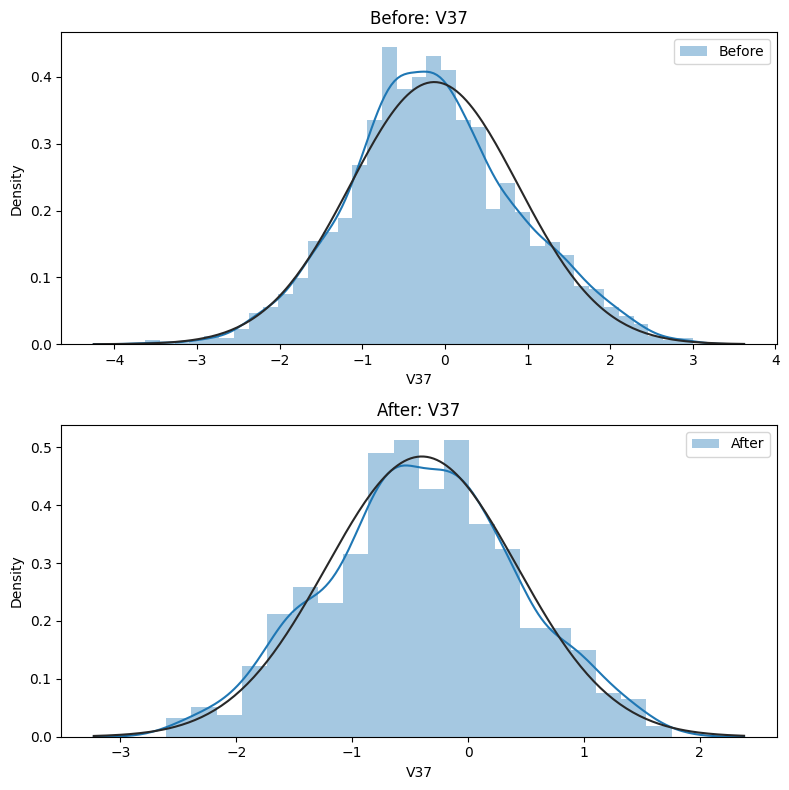

KeyError: 'target'

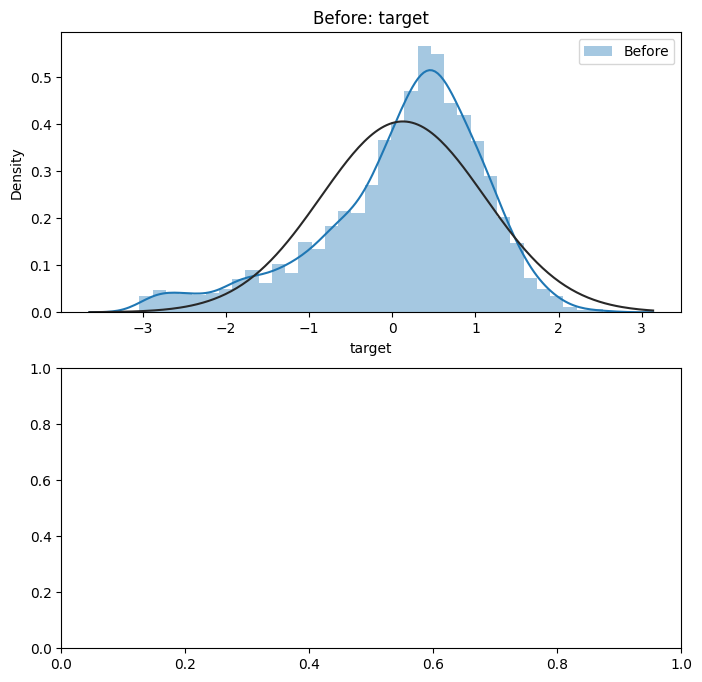

In [8]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from scipy import stats
from sklearn.decomposition import PCA
import seaborn as sns
import matplotlib.pyplot as plt
import warnings

warnings.filterwarnings("ignore")

# Original code
def original_code(data):
    X = data.iloc[:, :-1]
    y = data.iloc[:, -1]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)
    clf = LinearRegression()
    clf.fit(X_train, y_train)
    score = mean_squared_error(y_test, clf.predict(X_test))
    return score

# Modified code
def modified_code(data):
    # Function to remove outliers
    def remove_outliers(df):
        Q1 = df.quantile(0.25)
        Q3 = df.quantile(0.75)
        IQR = Q3 - Q1
        return df[~((df < (Q1 - 1.5 * IQR)) | (df > (Q3 + 1.5 * IQR))).any(axis=1)]

    # Remove outliers
    data_clean = remove_outliers(data.iloc[:, :-1])

    # Visualizing data distribution before and after modification
    for col in data.columns:
        fig, axes = plt.subplots(2, 1, figsize=(8, 8))
        sns.distplot(data[col], fit=stats.norm, ax=axes[0], label='Before')
        axes[0].set_title(f"Before: {col}")
        axes[0].legend()
        
        sns.distplot(data_clean[col], fit=stats.norm, ax=axes[1], label='After')
        axes[1].set_title(f"After: {col}")
        axes[1].legend()

        plt.tight_layout()
        plt.show()

    # Splitting data into features and target
    X_clean = data_clean.iloc[:, :-1]
    y_clean = data_clean.iloc[:, -1]

    # Train-test split with cleaned data
    X_train_clean, X_test_clean, y_train_clean, y_test_clean = train_test_split(X_clean, y_clean, test_size=0.3)

    # Train-test split with original data
    X_train, X_test, y_train, y_test = train_test_split(data.iloc[:, :-1], data.iloc[:, -1], test_size=0.3)

    # Linear Regression with original data
    clf_original = LinearRegression()
    clf_original.fit(X_train, y_train)
    score_original = mean_squared_error(y_test, clf_original.predict(X_test))

    # Linear Regression with cleaned data
    clf_clean = LinearRegression()
    clf_clean.fit(X_train_clean, y_train_clean)
    score_clean = mean_squared_error(y_test_clean, clf_clean.predict(X_test_clean))

    return score_original, score_clean

# Load the data
data_file = "Industrial_data_for regression_analysis.txt"
data = pd.read_csv(data_file, sep='\t', encoding='utf-8')

# Original code result
original_result = original_code(data)

# Modified code result
modified_result_original, modified_result_cleaned = modified_code(data)

# Comparison
print("Original Code Result (MSE):", original_result)
print("Modified Code Result - Original Data (MSE):", modified_result_original)
print("Modified Code Result - Cleaned Data (MSE):", modified_result_cleaned)


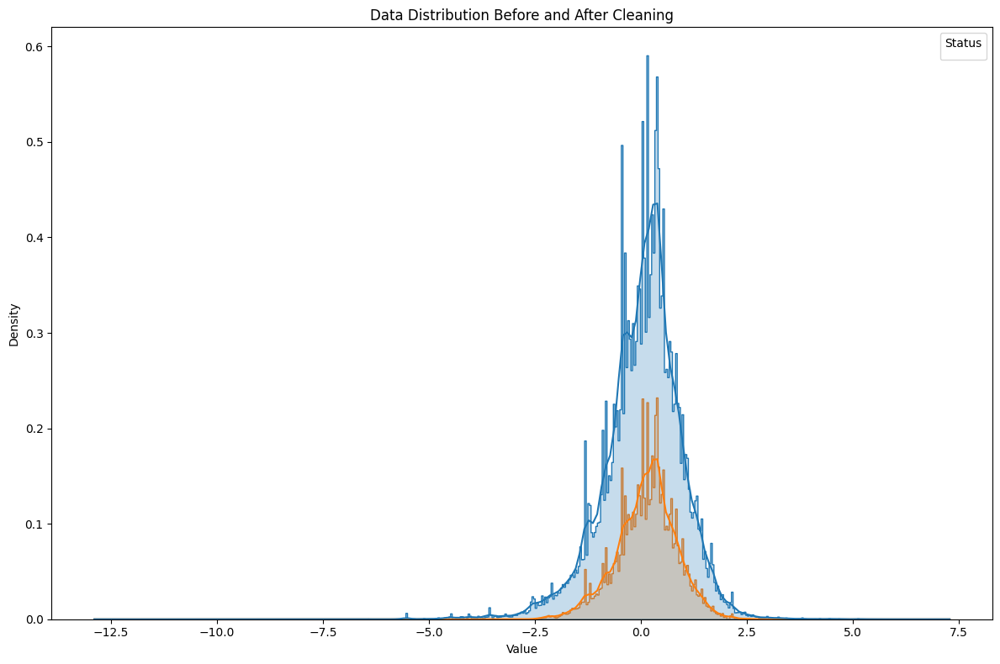

Original Code Result (MSE): 0.10726011952264006
Modified Code Result - Original Data (MSE): 0.10705285768537692
Modified Code Result - Cleaned Data (MSE): 0.11184732378511374


In [9]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from scipy import stats
from sklearn.decomposition import PCA
import seaborn as sns
import matplotlib.pyplot as plt
import warnings

warnings.filterwarnings("ignore")

# Original code
def original_code(data):
    X = data.iloc[:, :-1]
    y = data.iloc[:, -1]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)
    clf = LinearRegression()
    clf.fit(X_train, y_train)
    score = mean_squared_error(y_test, clf.predict(X_test))
    return score

# Modified code
def modified_code(data):
    # Function to remove outliers
    def remove_outliers(df):
        Q1 = df.quantile(0.25)
        Q3 = df.quantile(0.75)
        IQR = Q3 - Q1
        return df[~((df < (Q1 - 1.5 * IQR)) | (df > (Q3 + 1.5 * IQR))).any(axis=1)]

    # Remove outliers
    data_clean = remove_outliers(data.iloc[:, :-1])

    # Concatenate data before and after cleaning
    data_concat = pd.concat([data.melt(value_name='value', var_name='feature'),
                             data_clean.melt(value_name='value', var_name='feature')], 
                            keys=['Before', 'After'],
                            names=['Status']).reset_index(level=0)

    # Visualizing data distribution before and after modification
    plt.figure(figsize=(12, 8))
    sns.histplot(data=data_concat, x='value', hue='Status', element='step', kde=True, stat='density')
    plt.title("Data Distribution Before and After Cleaning")
    plt.legend(title='Status')
    plt.xlabel('Value')
    plt.ylabel('Density')
    plt.tight_layout()
    plt.show()

    # Splitting data into features and target
    X_clean = data_clean.iloc[:, :-1]
    y_clean = data_clean.iloc[:, -1]

    # Train-test split with cleaned data
    X_train_clean, X_test_clean, y_train_clean, y_test_clean = train_test_split(X_clean, y_clean, test_size=0.3)

    # Train-test split with original data
    X_train, X_test, y_train, y_test = train_test_split(data.iloc[:, :-1], data.iloc[:, -1], test_size=0.3)

    # Linear Regression with original data
    clf_original = LinearRegression()
    clf_original.fit(X_train, y_train)
    score_original = mean_squared_error(y_test, clf_original.predict(X_test))

    # Linear Regression with cleaned data
    clf_clean = LinearRegression()
    clf_clean.fit(X_train_clean, y_train_clean)
    score_clean = mean_squared_error(y_test_clean, clf_clean.predict(X_test_clean))

    return score_original, score_clean

# Load the data
data_file = "Industrial_data_for regression_analysis.txt"
data = pd.read_csv(data_file, sep='\t', encoding='utf-8')

# Original code result
original_result = original_code(data)

# Modified code result
modified_result_original, modified_result_cleaned = modified_code(data)

# Comparison
print("Original Code Result (MSE):", original_result)
print("Modified Code Result - Original Data (MSE):", modified_result_original)
print("Modified Code Result - Cleaned Data (MSE):", modified_result_cleaned)


KeyError: 'target'

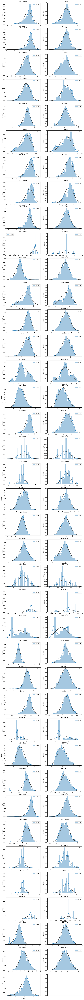

In [11]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from scipy import stats
from sklearn.decomposition import PCA
import seaborn as sns
import matplotlib.pyplot as plt
import warnings

warnings.filterwarnings("ignore")

# Original code
def original_code(data):
    X = data.iloc[:, :-1]
    y = data.iloc[:, -1]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)
    clf = LinearRegression()
    clf.fit(X_train, y_train)
    score = mean_squared_error(y_test, clf.predict(X_test))
    return score

# Modified code
def modified_code(data):
    # Function to remove outliers
    def remove_outliers(df):
        Q1 = df.quantile(0.25)
        Q3 = df.quantile(0.75)
        IQR = Q3 - Q1
        return df[~((df < (Q1 - 1.5 * IQR)) | (df > (Q3 + 1.5 * IQR))).any(axis=1)]

    # Remove outliers
    data_clean = remove_outliers(data.iloc[:, :-1])

    # Visualizing data distribution before and after modification
    fig, axes = plt.subplots(len(data.columns), 2, figsize=(12, 4 * len(data.columns)))
    for i, col in enumerate(data.columns):
        sns.distplot(data[col], fit=stats.norm, ax=axes[i, 0], label='Before')
        sns.distplot(data_clean[col], fit=stats.norm, ax=axes[i, 1], label='After')
        
        axes[i, 0].set_title(f"{col} - Before")
        axes[i, 0].legend()
        
        axes[i, 1].set_title(f"{col} - After")
        axes[i, 1].legend()

    plt.tight_layout()
    plt.show()

    # Splitting data into features and target
    X_clean = data_clean.iloc[:, :-1]
    y_clean = data_clean.iloc[:, -1]

    # Train-test split with cleaned data
    X_train_clean, X_test_clean, y_train_clean, y_test_clean = train_test_split(X_clean, y_clean, test_size=0.3)

    # Train-test split with original data
    X_train, X_test, y_train, y_test = train_test_split(data.iloc[:, :-1], data.iloc[:, -1], test_size=0.3)

    # Linear Regression with original data
    clf_original = LinearRegression()
    clf_original.fit(X_train, y_train)
    score_original = mean_squared_error(y_test, clf_original.predict(X_test))

    # Linear Regression with cleaned data
    clf_clean = LinearRegression()
    clf_clean.fit(X_train_clean, y_train_clean)
    score_clean = mean_squared_error(y_test_clean, clf_clean.predict(X_test_clean))

    return score_original, score_clean

# Load the data
data_file = "Industrial_data_for regression_analysis.txt"
data = pd.read_csv(data_file, sep='\t', encoding='utf-8')

# Original code result
original_result = original_code(data)

# Modified code result
modified_result_original, modified_result_cleaned = modified_code(data)

# Comparison
print("Original Code Result (MSE):", original_result)
print("Modified Code Result - Original Data (MSE):", modified_result_original)
print("Modified Code Result - Cleaned Data (MSE):", modified_result_cleaned)


KeyError: 'target'

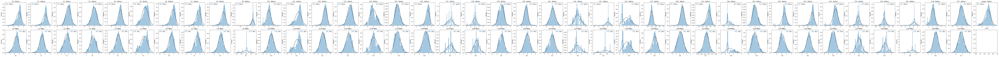

In [1]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from scipy import stats
from sklearn.decomposition import PCA
import seaborn as sns
import matplotlib.pyplot as plt
import warnings

warnings.filterwarnings("ignore")

# Original code
def original_code(data):
    X = data.iloc[:, :-1]
    y = data.iloc[:, -1]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)
    clf = LinearRegression()
    clf.fit(X_train, y_train)
    score = mean_squared_error(y_test, clf.predict(X_test))
    return score

# Modified code
def modified_code(data):
    # Function to remove outliers
    def remove_outliers(df):
        Q1 = df.quantile(0.25)
        Q3 = df.quantile(0.75)
        IQR = Q3 - Q1
        return df[~((df < (Q1 - 1.5 * IQR)) | (df > (Q3 + 1.5 * IQR))).any(axis=1)]

    # Remove outliers
    data_clean = remove_outliers(data.iloc[:, :-1])

    # Visualizing data distribution before and after modification
    fig, axes = plt.subplots(2, len(data.columns), figsize=(4*len(data.columns), 8))
    for i, col in enumerate(data.columns):
        sns.distplot(data[col], fit=stats.norm, ax=axes[0, i], label='Before')
        axes[0, i].set_title(f"{col} - Before")
        axes[0, i].legend()
        
        sns.distplot(data_clean[col], fit=stats.norm, ax=axes[1, i], label='After')
        axes[1, i].set_title(f"{col} - After")
        axes[1, i].legend()

    plt.tight_layout()
    plt.show()

    # Splitting data into features and target
    X_clean = data_clean.iloc[:, :-1]
    y_clean = data_clean.iloc[:, -1]

    # Train-test split with cleaned data
    X_train_clean, X_test_clean, y_train_clean, y_test_clean = train_test_split(X_clean, y_clean, test_size=0.3)

    # Train-test split with original data
    X_train, X_test, y_train, y_test = train_test_split(data.iloc[:, :-1], data.iloc[:, -1], test_size=0.3)

    # Linear Regression with original data
    clf_original = LinearRegression()
    clf_original.fit(X_train, y_train)
    score_original = mean_squared_error(y_test, clf_original.predict(X_test))

    # Linear Regression with cleaned data
    clf_clean = LinearRegression()
    clf_clean.fit(X_train_clean, y_train_clean)
    score_clean = mean_squared_error(y_test_clean, clf_clean.predict(X_test_clean))

    return score_original, score_clean

# Load the data
data_file = "Industrial_data_for regression_analysis.txt"
data = pd.read_csv(data_file, sep='\t', encoding='utf-8')

# Original code result
original_result = original_code(data)

# Modified code result
modified_result_original, modified_result_cleaned = modified_code(data)

# Comparison
print("Original Code Result (MSE):", original_result)
print("Modified Code Result - Original Data (MSE):", modified_result_original)
print("Modified Code Result - Cleaned Data (MSE):", modified_result_cleaned)
